In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
import plotly.express as px
import plotly.graph_objs as go
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [ ]:
df = pd.read_csv('/content/FTO_MAIN.csv')
print(df.shape)
df.head()

FileNotFoundError: ignored

## **Data Overview**

In [ ]:
for cols in df.columns:
    unique_vals = df[cols].unique()
    if len(unique_vals) <= 10:
        print("Feature ", cols, " has ", len(unique_vals), " unique values ----> ", unique_vals)
    else:
        print("Feature ", cols, " has ", len(unique_vals), " unique values")

Feature  Sl. No  has  229  unique values
Feature  Marital Status  has  2  unique values ---->  [1 0]
Feature  Qualification  has  2  unique values ---->  [0 1]
Feature  Occupation  has  2  unique values ---->  [0 1]
Feature  Personality Factors  has  2  unique values ---->  [0 1]
Feature  Q1  has  3  unique values ---->  [0 1 2]
Feature  Q2  has  3  unique values ---->  [0 1 2]
Feature  Q3  has  3  unique values ---->  [0 1 2]
Feature  Q4  has  3  unique values ---->  [0 2 1]
Feature  Q5  has  3  unique values ---->  [2 1 0]
Feature  Q6  has  3  unique values ---->  [1 0 2]
Feature  Q7  has  3  unique values ---->  [0 1 2]
Feature  Q8  has  3  unique values ---->  [0 1 2]
Feature  Q9  has  2  unique values ---->  [0 1]
Feature  Q10  has  2  unique values ---->  [1 0]
Feature  Q11  has  1  unique values ---->  [1]
Feature  Phy_Voilnc  has  2  unique values ---->  [0 1]
Feature  Emtnl_voilnc  has  2  unique values ---->  [0 1]
Feature  Sex_voilenc  has  2  unique values ---->  [0 1]
Feat

In [ ]:
## checking for null values
df.isnull().sum()

Sl. No                    0
Marital Status            0
Qualification             0
Occupation                0
Personality Factors       0
Q1                        0
Q2                        0
Q3                        0
Q4                        0
Q5                        0
Q6                        0
Q7                        0
Q8                        0
Q9                        0
Q10                       0
Q11                       0
Phy_Voilnc                0
Emtnl_voilnc              0
Sex_voilenc               0
psyco_voilnc              0
spri_voilnc               0
cultrl_voilnc             0
ASPD                      0
Substance Use             0
Mental_Disorders          0
Traumatic_exprnces        0
Phy_violnc                0
Sex_voilnc                0
Emtn_voilnc               0
Sprit_voilnc              0
ASPD.1                    0
Voilnet_Att               0
Willingness_mainstream    0
lonliness_depression      0
participation_games       0
current_psy_condtn  

# **Analysis on physical violence**

In [ ]:
lonliness_depression_yes= df[df['lonliness_depression']==1]
lonliness_depression_no = df[df['lonliness_depression']==0]

labels = ['Loneliness Depression','Without Loneliness Depression']
values = [len(lonliness_depression_yes), len(lonliness_depression_no)]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.4)])
fig.update_layout(
    title_text="Analysis on - Loneliness")
fig.show()

Depression vs Impression

In [ ]:
fig = px.pie(df, values='lonliness_depression',names='Impression', title='Depression vs Impression')
fig.show()

Analysis on Psychological Condition

In [ ]:
current_psy_condtn_good= df[df['current_psy_condtn']==1]
current_psy_condtn_bad = df[df['current_psy_condtn']==0]

labels = ['Good Psychological Condition','Bad Psychological Condition']
values = [len(current_psy_condtn_good), len(current_psy_condtn_bad)]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.4)])
fig.update_layout(
    title_text="Analysis on - Psychological Condition")
fig.show()

In [ ]:
## checking for null values
df.isnull().sum()

Sl. No                    0
Marital Status            0
Qualification             0
Occupation                0
Personality Factors       0
Q1                        0
Q2                        0
Q3                        0
Q4                        0
Q5                        0
Q6                        0
Q7                        0
Q8                        0
Q9                        0
Q10                       0
Q11                       0
Phy_Voilnc                0
Emtnl_voilnc              0
Sex_voilenc               0
psyco_voilnc              0
spri_voilnc               0
cultrl_voilnc             0
ASPD                      0
Substance Use             0
Mental_Disorders          0
Traumatic_exprnces        0
Phy_violnc                0
Sex_voilnc                0
Emtn_voilnc               0
Sprit_voilnc              0
ASPD.1                    0
Voilnet_Att               0
Willingness_mainstream    0
lonliness_depression      0
participation_games       0
current_psy_condtn  

In [ ]:
# remove duplicate entries, if any
df.drop_duplicates(inplace = True)
print(df.shape)

(229, 37)


In [ ]:
# Convert Catergorical values to numeric representation

df['Impression'].replace({0:'Low', 1:'Moderate', 2:'High'}, inplace = True)
df.head()

,Sl. No,Marital Status,Qualification,Occupation,Personality Factors,Q1,Q2,Q3,Q4,Q5,...,Sex_voilnc,Emtn_voilnc,Sprit_voilnc,ASPD.1,Voilnet_Att,Willingness_mainstream,lonliness_depression,participation_games,current_psy_condtn,Impression
0,1,1,0,0,0,0,0,0,0,2,...,0,0,0,1,1,0,1,0,0,Low
1,2,1,0,1,0,1,1,1,0,2,...,0,0,0,1,1,0,1,1,0,Low
2,3,1,0,1,0,1,0,0,2,2,...,0,0,0,1,1,0,1,1,1,Low
3,4,1,0,1,0,1,0,0,0,2,...,1,0,0,1,1,0,1,0,0,Low
4,5,1,0,0,0,1,0,1,0,1,...,0,0,0,1,1,1,1,1,1,Low


In [ ]:
print(df.shape)

(229, 37)


# **Feature Selection**

In [ ]:
df.dropna(inplace = True)
print(df.shape)

(229, 37)


In [ ]:
df.columns

Index(['Sl. No', 'Marital Status', 'Qualification', 'Occupation',
       'Personality Factors', 'Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'Q8',
       'Q9', 'Q10', 'Q11', 'Phy_Voilnc', 'Emtnl_voilnc', 'Sex_voilenc',
       'psyco_voilnc', 'spri_voilnc', 'cultrl_voilnc', 'ASPD', 'Substance Use',
       'Mental_Disorders', 'Traumatic_exprnces', 'Phy_violnc', 'Sex_voilnc',
       'Emtn_voilnc', 'Sprit_voilnc', 'ASPD.1', 'Voilnet_Att',
       'Willingness_mainstream', 'lonliness_depression', 'participation_games',
       'current_psy_condtn', 'Impression'],
      dtype='object')

In [ ]:
# Separate the independent (X) and dependent (y) features
X = df.drop(columns = 'Impression')
y = df['Impression']

In [ ]:
X.head()

,Sl. No,Marital Status,Qualification,Occupation,Personality Factors,Q1,Q2,Q3,Q4,Q5,...,Phy_violnc,Sex_voilnc,Emtn_voilnc,Sprit_voilnc,ASPD.1,Voilnet_Att,Willingness_mainstream,lonliness_depression,participation_games,current_psy_condtn
0,1,1,0,0,0,0,0,0,0,2,...,1,0,0,0,1,1,0,1,0,0
1,2,1,0,1,0,1,1,1,0,2,...,0,0,0,0,1,1,0,1,1,0
2,3,1,0,1,0,1,0,0,2,2,...,1,0,0,0,1,1,0,1,1,1
3,4,1,0,1,0,1,0,0,0,2,...,0,1,0,0,1,1,0,1,0,0
4,5,1,0,0,0,1,0,1,0,1,...,1,0,0,0,1,1,1,1,1,1


In [ ]:
y.head()

0    Low
1    Low
2    Low
3    Low
4    Low
Name: Impression, dtype: object

In [ ]:
from sklearn.model_selection import train_test_split
X.drop(columns = "Sl. No", inplace = True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 20)


In [ ]:
X_train.head()

,Marital Status,Qualification,Occupation,Personality Factors,Q1,Q2,Q3,Q4,Q5,Q6,...,Phy_violnc,Sex_voilnc,Emtn_voilnc,Sprit_voilnc,ASPD.1,Voilnet_Att,Willingness_mainstream,lonliness_depression,participation_games,current_psy_condtn
198,1,1,1,0,1,0,0,1,0,0,...,1,1,1,0,1,0,1,1,1,0
120,1,1,0,0,0,0,1,1,0,0,...,1,1,0,0,1,1,1,0,0,0
203,0,0,0,1,0,1,1,1,0,0,...,1,1,1,0,0,1,0,1,0,0
132,1,0,1,0,1,1,1,0,1,0,...,0,0,0,0,0,1,0,1,0,1
47,1,0,1,0,1,2,1,0,2,2,...,1,0,0,0,1,1,0,0,0,0


In [ ]:
corr = X_train.corr()
corr

# Note that the correlation values lie between -1 and +1
# A correlation value close to -1 indicates a strong negative linear correlation
# A correlation value close to +1 indicates a strong positive linear correlation
# A correlation value close to 0 indicates no linear correlation

,Marital Status,Qualification,Occupation,Personality Factors,Q1,Q2,Q3,Q4,Q5,Q6,...,Phy_violnc,Sex_voilnc,Emtn_voilnc,Sprit_voilnc,ASPD.1,Voilnet_Att,Willingness_mainstream,lonliness_depression,participation_games,current_psy_condtn
Marital Status,1.000000,-0.153475,0.030333,-0.121667,0.117153,-0.109790,0.207214,-0.127438,0.091329,-0.055711,...,0.012518,-0.005356,-0.026042,0.007535,0.112302,0.057215,-0.023555,0.002034,0.010410,0.196562
Qualification,-0.153475,1.000000,0.070074,0.038041,-0.133701,0.028245,-0.110396,0.060827,-0.168019,-0.014318,...,0.032715,-0.000374,0.173706,0.153344,0.067321,-0.077192,-0.049624,-0.032637,-0.013629,-0.163827
Occupation,0.030333,0.070074,1.000000,0.132565,0.036693,0.022430,-0.057663,0.059322,0.026212,0.139068,...,-0.182742,0.043865,0.055849,0.049303,0.064793,0.027386,0.049904,-0.172356,-0.011807,0.014734
Personality Factors,-0.121667,0.038041,0.132565,1.000000,0.178100,0.181299,-0.108298,0.096368,-0.033842,0.102369,...,0.108728,0.182998,0.127826,-0.034941,0.189013,0.096686,-0.051462,-0.139819,0.058992,-0.116600
Q1,0.117153,-0.133701,0.036693,0.178100,1.000000,0.232613,0.132532,0.204045,0.263072,-0.056030,...,-0.004871,-0.036246,-0.009944,-0.062011,0.174433,0.052719,-0.095063,0.033167,-0.048228,-0.007624
Q2,-0.109790,0.028245,0.022430,0.181299,0.232613,1.000000,0.060947,0.092523,0.076276,0.169753,...,0.063068,-0.037216,0.149213,-0.018711,0.080682,-0.100259,0.103060,-0.095842,0.065771,-0.008028
Q3,0.207214,-0.110396,-0.057663,-0.108298,0.132532,0.060947,1.000000,0.121821,-0.162949,-0.092681,...,0.070591,-0.147781,-0.207229,-0.031815,-0.134277,-0.048618,-0.239428,-0.090833,0.128627,0.179994
Q4,-0.127438,0.060827,0.059322,0.096368,0.204045,0.092523,0.121821,1.000000,0.047057,-0.103522,...,0.089238,-0.024710,-0.001671,-0.011660,-0.005468,-0.099226,-0.141222,-0.087449,0.000094,0.059506
Q5,0.091329,-0.168019,0.026212,-0.033842,0.263072,0.076276,-0.162949,0.047057,1.000000,0.127727,...,-0.074412,0.014900,0.051137,0.082629,0.142638,0.105441,0.095135,0.113426,-0.220962,0.047967
Q6,-0.055711,-0.014318,0.139068,0.102369,-0.056030,0.169753,-0.092681,-0.103522,0.127727,1.000000,...,0.114184,-0.107963,0.174494,-0.042175,0.167064,0.016730,0.258070,-0.110604,0.121029,0.038949


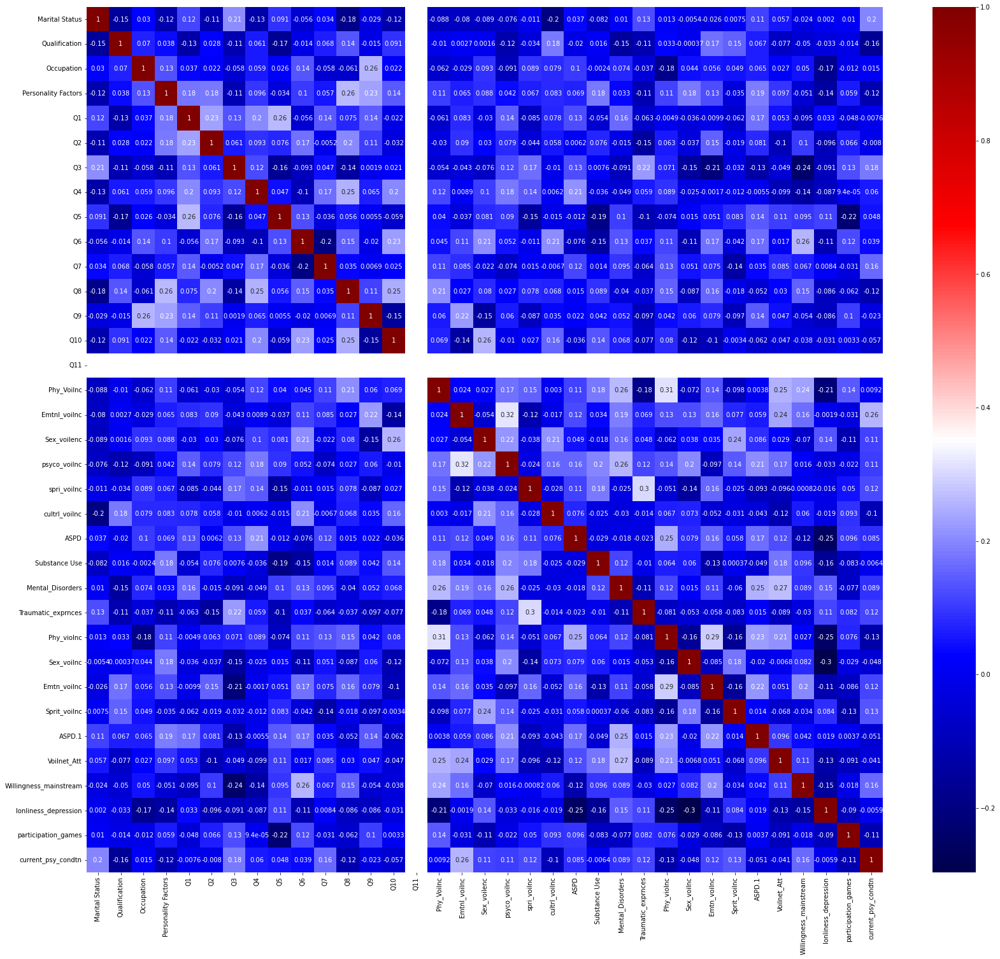

In [ ]:
# A good way to visualize correlation is using a heatmap
plt.figure(figsize = (28,25))
sns.heatmap(corr, annot = True, cmap = "seismic");
# A link to choose different cmaps: https://matplotlib.org/stable/tutorials/colors/colormaps.html

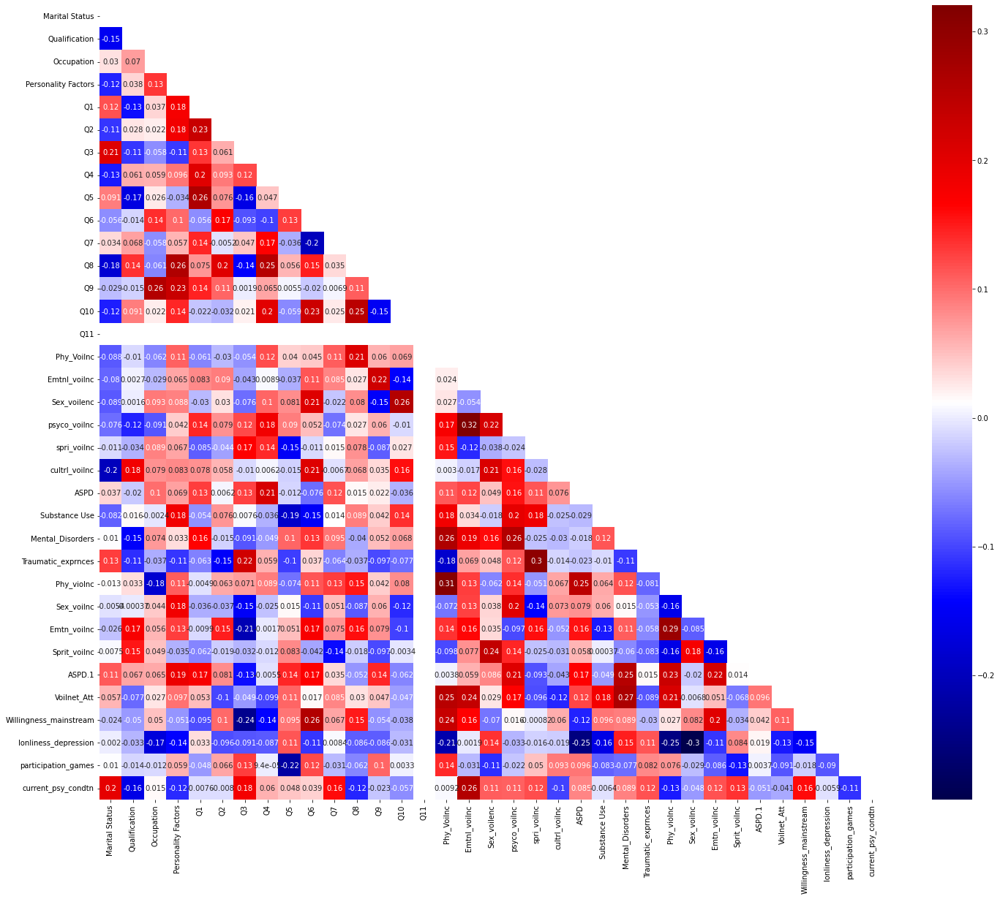

In [ ]:
# use of the mask
import numpy as np
mask1 = np.triu(np.ones_like(corr, dtype=bool))
mask2 = np.tril(np.ones_like(corr, dtype=bool))
plt.figure(figsize = (24,20))
sns.heatmap(corr, annot = True, cmap = "seismic", mask = mask1);

In [ ]:
# with the following function we can select highly correlated features
# it will remove the first feature that is highly correlated with another feature

def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of the redundant columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if(abs(corr_matrix.iloc[i, j])) > threshold:
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [ ]:
corr_features = correlation(X_train, 0.9) # 85% is a good value of the threshold
print(len(corr_features))
print(corr_features)

0
set()


In [ ]:
df.drop(columns = "Q11", axis = 1,  inplace = True)

In [ ]:
df.columns.values.tolist()

['Sl. No',
 'Marital Status',
 'Qualification',
 'Occupation',
 'Personality Factors',
 'Q1',
 'Q2',
 'Q3',
 'Q4',
 'Q5',
 'Q6',
 'Q7',
 'Q8',
 'Q9',
 'Q10',
 'Phy_Voilnc',
 'Emtnl_voilnc',
 'Sex_voilenc',
 'psyco_voilnc',
 'spri_voilnc',
 'cultrl_voilnc',
 'ASPD',
 'Substance Use',
 'Mental_Disorders',
 'Traumatic_exprnces',
 'Phy_violnc',
 'Sex_voilnc',
 'Emtn_voilnc',
 'Sprit_voilnc',
 'ASPD.1',
 'Voilnet_Att',
 'Willingness_mainstream',
 'lonliness_depression',
 'participation_games',
 'current_psy_condtn',
 'Impression']

### ***Random Forest Classifier***

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV


In [ ]:
n_estimators = [10, 20, 40, 60, 80, 100, 120, 200, 400, 600, 800, 1000]

max_features = ['auto', 'sqrt', 'log2']

max_depth = [10, 120, 230, 340, 450,560, 670, 780, 890, 1000]

min_samples_leaf = [1, 2, 4,6, 8, 10]

min_samples_split =  [2, 5, 10, 14]

criterion = ['gini', 'entropy']






In [ ]:
random_grid = {'n_estimators':n_estimators,
              'max_features':max_features,
              'max_depth': max_depth,
              'min_samples_leaf': min_samples_leaf,
              'min_samples_split': min_samples_split,
              'criterion': criterion
              }
print(random_grid)

{'n_estimators': [10, 20, 40, 60, 80, 100, 120, 200, 400, 600, 800, 1000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_leaf': [1, 2, 4, 6, 8, 10], 'min_samples_split': [2, 5, 10, 14], 'criterion': ['gini', 'entropy']}


In [ ]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(X_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8, 10],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [10, 20, 40, 60, 80,
                                                         100, 120, 200, 400,
                                                         600, 800, 1000]},
                   random_state=100, verbose=2)

In [ ]:
rf_randomcv.best_params_

{'n_estimators': 120,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'log2',
 'max_depth': 1000,
 'criterion': 'gini'}

In [ ]:
rf_randomcv

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8, 10],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [10, 20, 40, 60, 80,
                                                         100, 120, 200, 400,
                                                         600, 800, 1000]},
                   random_state=100, verbose=2)

In [ ]:
rf_randomcv.best_estimator_

RandomForestClassifier(max_depth=1000, max_features='log2', min_samples_leaf=4,
                       min_samples_split=5, n_estimators=120)

In [ ]:
best_random_grid=rf_randomcv.best_estimator_

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
y_pred=best_random_grid.predict(X_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 8  0  4]
 [ 0 16  1]
 [ 0  6 11]]
Accuracy Score 0.7608695652173914
Classification report:               precision    recall  f1-score   support

        High       1.00      0.67      0.80        12
         Low       0.73      0.94      0.82        17
    Moderate       0.69      0.65      0.67        17

    accuracy                           0.76        46
   macro avg       0.80      0.75      0.76        46
weighted avg       0.78      0.76      0.76        46



# ***LIME on Random Forest Classifier***

In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 275 kB 4.0 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=53e4fc4d0a78f3b441d0edc1efb4bd61ee9ef32f128942355ab549f9ec6b3bf7
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [ ]:
import lime

In [ ]:
from lime import lime_tabular

In [ ]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['Low', 'Moderate', 'High'],
    mode='classification'
)

In [ ]:
X_test.iloc[5], y_test.iloc[5]

(Marital Status            1
 Qualification             0
 Occupation                1
 Personality Factors       0
 Q1                        0
 Q2                        0
 Q3                        1
 Q4                        1
 Q5                        0
 Q6                        0
 Q7                        0
 Q8                        0
 Q9                        0
 Q10                       0
 Q11                       1
 Phy_Voilnc                1
 Emtnl_voilnc              1
 Sex_voilenc               0
 psyco_voilnc              1
 spri_voilnc               0
 cultrl_voilnc             0
 ASPD                      0
 Substance Use             0
 Mental_Disorders          0
 Traumatic_exprnces        0
 Phy_violnc                1
 Sex_voilnc                0
 Emtn_voilnc               1
 Sprit_voilnc              0
 ASPD.1                    0
 Voilnet_Att               1
 Willingness_mainstream    0
 lonliness_depression      1
 participation_games       1
 current_psy_c

In [ ]:
Random_Forest = RandomForestClassifier()

In [ ]:
Random_Forest.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
score = Random_Forest.score(X_test, y_test)
score

0.782608695652174

In [ ]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[15],
    predict_fn=Random_Forest.predict_proba, num_features =20
)

exp.show_in_notebook(show_table=True)

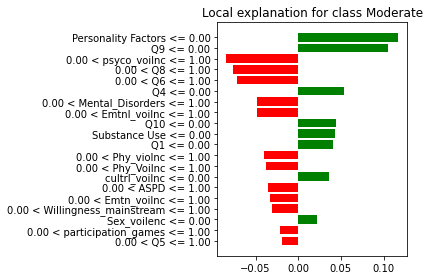

In [ ]:
plt = exp.as_pyplot_figure()
plt.tight_layout()

KNN

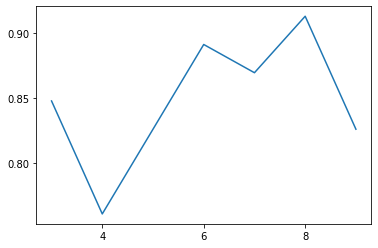

In [ ]:
# Finding the optimum number of neighbors

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
list1 = []
for neighbors in range(3,10):
    classifier = KNeighborsClassifier(n_neighbors=neighbors, metric='minkowski')
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)
    list1.append(accuracy_score(y_test,y_pred))
plt.plot(list(range(3,10)), list1)
sns.set(font_scale=1.5)
plt.show()

In [ ]:
# Training the K Nearest Neighbor Classifier on the Training set

KNN = KNeighborsClassifier(n_neighbors=8)
KNN.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=8)

In [ ]:
# Predicting the Test set results

y_pred = classifier.predict(X_test)
print(y_pred)

['Low' 'High' 'High' 'High' 'Moderate' 'Low' 'Low' 'Moderate' 'Low' 'High'
 'Moderate' 'Low' 'Low' 'Low' 'High' 'High' 'Low' 'Low' 'Moderate' 'Low'
 'High' 'Moderate' 'High' 'Moderate' 'Low' 'High' 'Low' 'Moderate' 'Low'
 'Low' 'High' 'Low' 'Low' 'Low' 'High' 'Low' 'Moderate' 'Low' 'Moderate'
 'Low' 'Low' 'Low' 'Moderate' 'High' 'Moderate' 'High']


In [ ]:
# Making the confusion matrix and calculating accuracy score
import sklearn.metrics as metrics
mylist = []
from sklearn.metrics import confusion_matrix, accuracy_score

cm = confusion_matrix(y_test, y_pred)
ac = accuracy_score(y_test, y_pred)
mylist.append(ac)
print(cm)
print(ac)
print("Classification Report")
print(metrics.classification_report(y_test, y_pred, digits = 3))

[[12  0  0]
 [ 0 16  1]
 [ 1  6 10]]
0.8260869565217391
Classification Report
              precision    recall  f1-score   support

        High      0.923     1.000     0.960        12
         Low      0.727     0.941     0.821        17
    Moderate      0.909     0.588     0.714        17

    accuracy                          0.826        46
   macro avg      0.853     0.843     0.832        46
weighted avg      0.846     0.826     0.818        46



In [ ]:
print("Accuracy of K Neighbors Classifier is : ", "{:.2f}%".format(100*ac))

Accuracy of K Neighbors Classifier is :  82.61%


In [ ]:
from sklearn.metrics import f1_score, accuracy_score
!pip install lime
!pip install interpret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 275 kB 5.0 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=7d1cfcf1fdc4e37c5636cb19a97ed48e41e115ef9713c9a2e112d0271caa1427
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 6.6 MB 5.4 MB/s 
     |████████████████████████████████| 756 kB 70.5 MB/s 
     |████████████████████████████████| 3.6 MB 48.6 MB/s 
     |████████████████████████████████| 9.9 MB 49.1 MB/s 
     |████████████████████████████████| 5.8 MB 31.2 MB/s 
     |████████████████████████████████| 569 kB 59.1 MB/s 
     |████████████████████████████████| 281 kB 62.8 MB/s 
     |████████████████████████████████| 251 kB 43.3 MB/s 
  

In [ ]:
import lime.lime_tabular

In [ ]:
from interpret.blackbox import LimeTabular
from interpret import show

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors=8)
classifier.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=8)

In [ ]:
import pickle
pickle.dump(classifier, open("classifier.pkl",'wb'))

In [ ]:
from lime import lime_tabular
interpretor = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train),feature_names=X_train.columns,mode='classification')

In [ ]:
exp = interpretor.explain_instance(
    data_row=X_test.iloc[15], ##new data
    predict_fn=classifier.predict_proba
)

exp.show_in_notebook(show_table=True)

SHAP on KNN

In [ ]:
import sklearn
import shap

shap.initjs()

In [ ]:
knn = sklearn.neighbors.KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [ ]:
f = lambda x: knn.predict_proba(x)[:,1]
med = X_train.median().values.reshape((1,X_train.shape[1]))
explainer = shap.KernelExplainer(f, med)
shap_values_single = explainer.shap_values(X.iloc[0,:], nsamples=1000)
shap.force_plot(explainer.expected_value, shap_values_single, X_display.iloc[0,:])

NameError: ignored

# ***Support Vector Classifier***

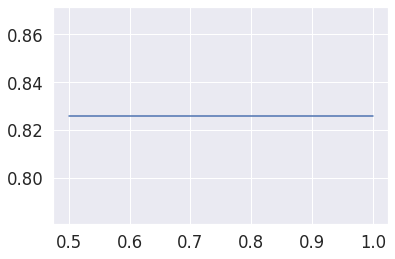

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, accuracy_score
list1 = []
for c in [0.5,0.6,0.7,0.8,0.9,1.0]:
    classifier = SVC(C = 5, random_state=0, kernel = 'rbf')
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)
    list1.append(accuracy_score(y_test,y_pred))
plt.plot([0.5,0.6,0.7,0.8,0.9,1.0], list1)
sns.set(font_scale=1.5)
plt.show()

In [ ]:
# Training the Support Vector Classifier on the Training set

from sklearn.svm import SVC
svc = SVC(C = 1.0, random_state=0, kernel = 'rbf')
classifier.fit(X_train, y_train)

SVC(random_state=0)

In [ ]:
# Predicting the test set results

y_pred = classifier.predict(X_test)
print(y_pred)

['Low' 'Moderate' 'High' 'High' 'Moderate' 'Low' 'Low' 'Moderate' 'Low'
 'High' 'Moderate' 'Low' 'Low' 'Low' 'High' 'High' 'Low' 'Moderate'
 'Moderate' 'Low' 'High' 'Low' 'High' 'Moderate' 'Low' 'High' 'Low' 'Low'
 'Low' 'Moderate' 'High' 'Low' 'Low' 'Low' 'Moderate' 'Low' 'Moderate'
 'Low' 'Moderate' 'Moderate' 'Low' 'Low' 'Moderate' 'Moderate' 'Moderate'
 'High']


In [ ]:
# Making the confusion matrix and calculating accuracy score

from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
ac = accuracy_score(y_test, y_pred)
print(cm)
print(ac)

print("Accuracy of SUPPORT VECTOR Classifier is : ", "{:.2f}%".format(100*ac))
print("Classification Report")
print(metrics.classification_report(y_test, y_pred, digits = 3))

[[10  0  2]
 [ 0 16  1]
 [ 0  5 12]]
0.8260869565217391
Accuracy of SUPPORT VECTOR Classifier is :  82.61%
Classification Report
              precision    recall  f1-score   support

        High      1.000     0.833     0.909        12
         Low      0.762     0.941     0.842        17
    Moderate      0.800     0.706     0.750        17

    accuracy                          0.826        46
   macro avg      0.854     0.827     0.834        46
weighted avg      0.838     0.826     0.826        46



In [ ]:
import pickle
pickle.dump(classifier, open("classifier.pkl",'wb'))

In [ ]:
interpretor = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train),feature_names=X_train.columns,mode='classification')

In [ ]:
exp = interpretor.explain_instance(
    data_row=X_test.iloc[15], ##new data
    predict_fn=classifier.predict_proba
)

exp.show_in_notebook(show_table=True)

In [ ]:
from sklearn.svm import SVC
clf = SVC(gamma = 'auto', random_state = 0)
clf.fit(X_train, y_train)
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)
print("Train Accuracy: ", accuracy_score(y_pred_train, y_train))
print("Test Accuracy: ", accuracy_score(y_pred_test, y_test))

Train Accuracy:  0.7923497267759563
Test Accuracy:  0.7391304347826086


In [ ]:
# for the SVC classifier
from sklearn import metrics
print("Confusion Matrix for the Test Case")
print(metrics.confusion_matrix(y_test, y_pred_test))
print()
print("Classification Report")
print(metrics.classification_report(y_test, y_pred_test, digits = 3))

Confusion Matrix for the Test Case
[[ 8  0  4]
 [ 0 14  3]
 [ 0  5 12]]

Classification Report
              precision    recall  f1-score   support

        High      1.000     0.667     0.800        12
         Low      0.737     0.824     0.778        17
    Moderate      0.632     0.706     0.667        17

    accuracy                          0.739        46
   macro avg      0.789     0.732     0.748        46
weighted avg      0.767     0.739     0.743        46



# ***LIME***

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, accuracy_score
!pip install lime
!pip install interpret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 275 kB 15.1 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=43f82cf6abe6ceb92b9268b3281d7dd78ca0d76c2bf9a9f90875852b6efbac0c
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 6.6 MB 16.1 MB/s 
     |████████████████████████████████| 5.8 MB 57.7 MB/s 
     |████████████████████████████████| 9.9 MB 49.0 MB/s 
     |████████████████████████████████| 3.6 MB 49.3 MB/s 
     |████████████████████████████████| 756 kB 71.6 MB/s 
     |████████████████████████████████| 281 kB 54.2 MB/s 
     |████████████████████████████████| 569 kB 47.5 MB/s 
     |████████████████████████████████| 251 kB 62.7 MB/s 


In [ ]:
import lime.lime_tabular

In [ ]:
from interpret.blackbox import LimeTabular
from interpret import show

In [ ]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier()
classifier.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
import pickle

In [ ]:
pickle.dump(classifier, open("classifier.pkl",'wb'))

In [ ]:
import lime

In [ ]:
from lime import lime_tabular

In [ ]:
interpretor = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train),feature_names=X_train.columns,mode='classification')

In [ ]:
exp = interpretor.explain_instance(
    data_row=X_test.iloc[15], ##new data
    predict_fn=classifier.predict_proba
)

exp.show_in_notebook(show_table=True)

In [ ]:
exp.as_list()

[('Q9 <= 0.00', 0.11763209885957754),
 ('Personality Factors <= 0.00', 0.10649550847377062),
 ('0.00 < psyco_voilnc <= 1.00', -0.0857351831603497),
 ('Q4 <= 0.00', 0.07436373510295184),
 ('0.00 < Q8 <= 1.00', -0.07360816450547099),
 ('0.00 < Q6 <= 1.00', -0.0721559429624314),
 ('0.00 < Emtnl_voilnc <= 1.00', -0.05689709912375317),
 ('0.00 < Phy_violnc <= 1.00', -0.05230416372819718),
 ('Q10 <= 0.00', 0.0457329525312709),
 ('Q1 <= 0.00', 0.044641266717975615)]

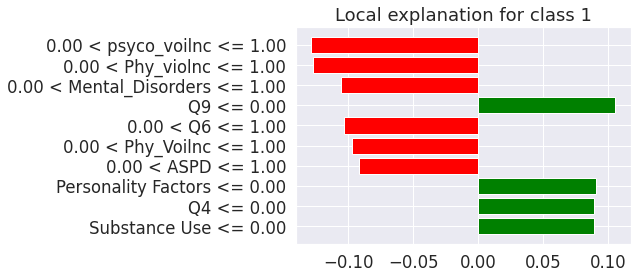

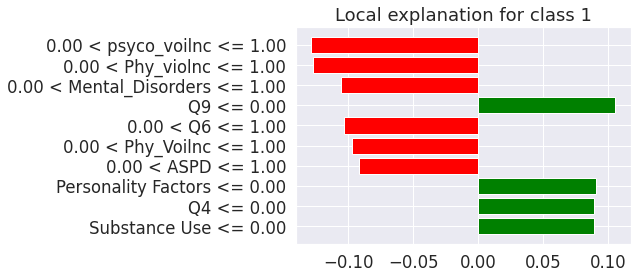

In [ ]:
exp.as_pyplot_figure()

### ***MLP Classifier***

In [ ]:
from sklearn.neural_network import MLPClassifier

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {

    'hidden_layer_sizes':[5],
    'activation': ['identity','logistic','tanh','relu'],
    'solver': ['lbfgs','sgd','adam'],
    'learning_rate':['constant','invscaling','adaptive']
}

gridSearch = GridSearchCV(MLPClassifier(), param_grid, cv=5, scoring=['recall','f1'],refit='f1',verbose=2)
gridSearch.fit(X_train, y_train)
print('Score: ', gridSearch.best_score_)
print('Parameters: ', gridSearch.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END activation=identity, hidden_layer_sizes=5, learning_rate=constant, solver=lbfgs; total time=   0.1s
[CV] END activation=identity, hidden_layer_sizes=5, learning_rate=constant, solver=lbfgs; total time=   0.1s
[CV] END activation=identity, hidden_layer_sizes=5, learning_rate=constant, solver=lbfgs; total time=   0.1s
[CV] END activation=identity, hidden_layer_sizes=5, learning_rate=constant, solver=lbfgs; total time=   0.1s
[CV] END activation=identity, hidden_layer_sizes=5, learning_rate=constant, solver=lbfgs; total time=   0.1s
[CV] END activation=identity, hidden_layer_sizes=5, learning_rate=constant, solver=sgd; total time=   0.1s
[CV] END activation=identity, hidden_layer_sizes=5, learning_rate=constant, solver=sgd; total time=   0.1s
[CV] END activation=identity, hidden_layer_sizes=5, learning_rate=constant, solver=sgd; total time=   0.1s
[CV] END activation=identity, hidden_layer_sizes=5, learning_rate=consta

In [ ]:
gridSearch.best_estimator_

MLPClassifier(activation='identity', hidden_layer_sizes=5, solver='lbfgs')

In [ ]:
best_grid=gridSearch.best_estimator_

In [ ]:
m = MLPClassifier(activation='identity', hidden_layer_sizes=5, learning_rate = 'constant' , solver='lbfgs')

In [ ]:
m.fit(X_train, y_train)

MLPClassifier(activation='identity', hidden_layer_sizes=5, solver='lbfgs')

In [ ]:
y_predTrain = m.predict(X_train)

y_predTest = m.predict(X_test)

trainAcc = []
testAcc = []

In [ ]:
trainAcc.append(accuracy_score(y_train, y_predTrain))
testAcc.append(accuracy_score(y_test, y_predTest))

In [ ]:
print(" Training Accuracy = ", trainAcc, ", Test Accuracy = ", testAcc)

print("Confusion Matrix for the Test Case")
print(metrics.confusion_matrix(y_test, y_predTest))
print()
print("Classification Report")
print(metrics.classification_report(y_test, y_predTest, digits = 3))

 Training Accuracy =  [0.8524590163934426] , Test Accuracy =  [0.8043478260869565]
Confusion Matrix for the Test Case
[[11  0  1]
 [ 0 15  2]
 [ 2  4 11]]

Classification Report
              precision    recall  f1-score   support

        High      0.846     0.917     0.880        12
         Low      0.789     0.882     0.833        17
    Moderate      0.786     0.647     0.710        17

    accuracy                          0.804        46
   macro avg      0.807     0.815     0.808        46
weighted avg      0.803     0.804     0.800        46



# **LIME FOR MLP **

In [ ]:
from sklearn.metrics import f1_score, accuracy_score
!pip install lime
!pip install interpret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import lime.lime_tabular
from interpret.blackbox import LimeTabular
from interpret import show
import pickle

In [ ]:
classifier = MLPClassifier(random_state = 5)

In [ ]:
classifier.fit(X_train, y_train)

MLPClassifier(random_state=5)

In [ ]:
pickle.dump(classifier, open("m.pkl",'wb'))

In [ ]:
from lime import lime_tabular
interpretor = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train),feature_names=X_train.columns,mode='classification')

In [ ]:
y_test

76     Moderate
102    Moderate
89         High
195        High
77     Moderate
13          Low
128         Low
134    Moderate
172    Moderate
224        High
182    Moderate
81          Low
97          Low
63          Low
108        High
62         High
34          Low
187    Moderate
20     Moderate
44     Moderate
176        High
164    Moderate
119        High
199    Moderate
171         Low
59         High
91          Low
104         Low
167         Low
87     Moderate
53         High
5           Low
21     Moderate
1           Low
116        High
140         Low
196    Moderate
189         Low
208    Moderate
100         Low
221         Low
72          Low
188    Moderate
212        High
169    Moderate
103        High
Name: Impression, dtype: object

['Low' 'Moderate' 'High' 'High' 'Moderate' 'Low' 'Low' 'Moderate' 'Low'
 'High' 'Moderate' 'Low' 'Low' 'Low' 'High' 'High' 'Low' 'Moderate'
 'Moderate' 'Low' 'High' 'Moderate' 'High' 'Moderate' 'Low' 'High'
 'Moderate' 'Low' 'Low' 'Moderate' 'High' 'Low' 'Low' 'Low' 'Moderate'
 'Low' 'Moderate' 'Low' 'Moderate' 'Moderate' 'Low' 'Low' 'Moderate'
 'Moderate' 'Moderate' 'Moderate']


In [ ]:
exp = interpretor.explain_instance(
    data_row=X_test.iloc[], ##new data
    predict_fn=classifier.predict_proba
)

exp.show_in_notebook(show_table=True)

SyntaxError: ignored

EOC (KNN + SVC + MLP)

In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

In [ ]:
estimator_list = [
    ('knn',KNN),
    ('svc',svc),
    ('mlp',mlp) ]

In [ ]:
# Build stack model
stack_model = StackingClassifier(
    estimators=estimator_list, final_estimator=LogisticRegression()
)

In [ ]:
stack_model.fit(X_train, y_train)

StackingClassifier(estimators=[('knn', KNeighborsClassifier(n_neighbors=8)),
                               ('svc', SVC(random_state=0)),
                               ('mlp', MLPClassifier(random_state=5))],
                   final_estimator=LogisticRegression())

In [ ]:
y_train_pred = stack_model.predict(X_train)
y_test_pred = stack_model.predict(X_test)

In [ ]:
from sklearn.metrics import precision_score
# calculates recall for 1:100 dataset with 90 tp and 10 fn
from sklearn.metrics import recall_score
stack_model_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
stack_model_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score
recall_train = recall_score(y_train, y_train_pred,  average='weighted')

In [ ]:
stack_model_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
stack_model_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score
stack_model_test_precision = precision_score(y_train, y_train_pred,labels=[1,2], average='micro')
recall_test = recall_score(y_train, y_train_pred, average='weighted')

In [ ]:
print('Model performance for Training set')
print('- Accuracy: %s' % stack_model_train_accuracy)

print('- F1 score: %s' % stack_model_train_f1)
print('- Recall score: %s' % recall_train)




print('Model performance for Test set')
print('- Accuracy: %s' % stack_model_test_accuracy)
print('- F1 score: %s' % stack_model_test_f1)
print('- Recall score: %s' % recall_test)

Model performance for Training set
- Accuracy: 0.9726775956284153
- F1 score: 0.9726433932926588
- Recall score: 0.9726775956284153
Model performance for Test set
- Accuracy: 0.8695652173913043
- F1 score: 0.8677345537757438
- Recall score: 0.9726775956284153


# **EOC LIME**

In [ ]:
import lime.lime_tabular
from interpret.blackbox import LimeTabular
from interpret import show

In [ ]:
stack_model = StackingClassifier( estimators=estimator_list, final_estimator=LogisticRegression())

In [ ]:
stack_model.fit(X_train, y_train)

StackingClassifier(estimators=[('knn', KNeighborsClassifier(n_neighbors=8)),
                               ('svc', SVC(random_state=0)),
                               ('mlp', MLPClassifier(random_state=5))],
                   final_estimator=LogisticRegression())

In [ ]:
import pickle
pickle.dump(stack_model, open("classifier.pkl",'wb'))

In [ ]:
interpretor = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train),feature_names=X_train.columns,mode='classification')

In [ ]:
exp = interpretor.explain_instance(
    data_row=X_test.iloc[4], ##new data
    predict_fn=stack_model.predict_proba)

exp.show_in_notebook(show_table=True)

# **Naive-Bayes Classifier**

In [ ]:
# Multinomial Naive Bayes

from sklearn.naive_bayes import GaussianNB


In [ ]:
gaussian_nb = GaussianNB()
gaussian_nb.fit(X_train, y_train)

GaussianNB()

In [ ]:
y_predTrain = gaussian_nb.predict(X_train)

y_predTest = gaussian_nb.predict(X_test)

trainAcc = []
testAcc = []

In [ ]:
from sklearn.metrics import accuracy_score
trainAcc.append(accuracy_score(y_train, y_predTrain))
testAcc.append(accuracy_score(y_test, y_predTest))

In [ ]:
from sklearn  import metrics
print(" Training Accuracy = ", trainAcc, ", Test Accuracy = ", testAcc)

print("Confusion Matrix for the Test Case")
print(metrics.confusion_matrix(y_test, y_predTest))
print()
print("Classification Report")
print(metrics.classification_report(y_test, y_predTest, digits = 3))

 Training Accuracy =  [0.5956284153005464] , Test Accuracy =  [0.6304347826086957]
Confusion Matrix for the Test Case
[[12  0  0]
 [ 0 16  1]
 [ 4 12  1]]

Classification Report
              precision    recall  f1-score   support

        High      0.750     1.000     0.857        12
         Low      0.571     0.941     0.711        17
    Moderate      0.500     0.059     0.105        17

    accuracy                          0.630        46
   macro avg      0.607     0.667     0.558        46
weighted avg      0.592     0.630     0.525        46



SyntaxError: ignored

In [ ]:
from sklearn import metrics
from sklearn.naive_bayes import MultinomialNB


In [ ]:
mm=MultinomialNB(alpha=0.6,fit_prior=True, class_prior=)
mm.fit(X_train, y_train)
print("Train Accuracy ",mm.score(X_train, y_train))
print("Test Accuracy ",mm.score(X_test, y_test))

TypeError: ignored

In [ ]:
from sklearn.naive_bayes import GaussianNB

In [ ]:
GNB = GaussianNB(var_smoothing=2e-9)

In [ ]:
GNB.fit(X_train, y_train)

GaussianNB(var_smoothing=2e-09)

In [ ]:
print("Train Accuracy ",mm.score(X_train, y_train))
print("Test Accuracy ",mm.score(X_test, y_test))

Train Accuracy  0.644808743169399
Test Accuracy  0.5217391304347826
